In [1]:
# !pip install pycrs

In [2]:
# import ee
# import geemap
# import webbrowser

# # Initialize the Earth Engine module
# ee.Authenticate()
# ee.Initialize()


In [7]:

# Define the path to the shapefile
shapefile_path = r"D:\friend_works\gadm36_TJK_shp\gadm36_TJK_2.shp"
print(shapefile_path)  # Check the file path


D:\friend_works\gadm36_TJK_shp\gadm36_TJK_2.shp


In [8]:

# Load the shapefile and convert it to an Earth Engine FeatureCollection
try:
    project_site = geemap.shp_to_ee(shapefile_path)
    if project_site is None:
        raise Exception("Shapefile loaded as None. Please check the file format and path.")
except Exception as e:
    raise Exception(f"Error loading shapefile: {e}")

# Print to verify if the shapefile is loaded correctly
print("Shapefile loaded successfully:", project_site.size().getInfo())


Shapefile loaded successfully: 59


In [16]:
# Define the map
Map = geemap.Map()

# Add the project site shapefile to the map

filtered_feature = project_site.filter(ee.Filter.eq('GID_2', "TJK.5.13_1"))  
Map.addLayer(filtered_feature, {"color": "red"}, "Project Site")

# Center the map around the project site
Map.centerObject(project_site, 10)

# Display the map
Map

Map(center=[38.53500039554791, 71.05073897478267], controls=(WidgetControl(options=['position', 'transparent_b…

In [18]:

# Load Landsat 5 Collection 2 ImageCollection and filter it
landsat_collection = ee.ImageCollection('LANDSAT/LT05/C02/T1_L2') \
    .filterBounds(filtered_feature) \
    .filterDate('2003-05-25', '2004-10-30')

# Check if the collection is empty
collection_size = landsat_collection.size().getInfo()
if collection_size == 0:
    raise Exception("No Landsat 5 images found for the specified date range and filter criteria.")

print(f"Landsat 5 images found: {collection_size}")

# Select the median image to reduce cloud cover
landsat_image = landsat_collection.median().clip(project_site)

# Define the export task
task = ee.batch.Export.image.toDrive(
    image=landsat_image,
    description='Landsat5_Project_Site_2002',
    folder='EarthEngineExports',
    fileNamePrefix='landsat5_project_site_2002',
    region=project_site.geometry().bounds().getInfo()['coordinates'],
    scale=30,
    crs='EPSG:4326',
    maxPixels=1e13
)

# Start the export task
task.start()

print('Export task started. Check Google Drive for the exported image.')

# Initialize a map
Map = geemap.Map()

# Add the layers to the map
Map.addLayer(project_site, {}, 'Project Site')
Map.addLayer(landsat_image, {'bands': ['SR_B4', 'SR_B3', 'SR_B2'], 'max': 3000}, 'Landsat Image')

# Center the map on the project site
Map.centerObject(project_site, 7)

# Save the map to an HTML file
html_file = 'landsat5_project_site_1998.html'
Map.to_html(html_file)

# Open the HTML file in the default web browser
webbrowser.open(html_file)

print('Map has been saved as an HTML file and opened in the browser.')

Exception: No Landsat 5 images found for the specified date range and filter criteria.

In [4]:
# !pip install xarray

In [14]:
import os
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import rasterio
from matplotlib.colors import ListedColormap



In [8]:

# Define paths to the dataset
TRAIN_RGB_DIR = r"D:\DFC2025-OEM-SAR-Baseline\dataset\train\rgb_images"
TRAIN_SAR_DIR = r"D:\DFC2025-OEM-SAR-Baseline\dataset\train\sar_images"
TRAIN_LABEL_DIR = r"D:\DFC2025-OEM-SAR-Baseline\dataset\train\labels"
# Get list of image filenames
image_filenames = sorted(os.listdir(TRAIN_RGB_DIR))
sar_filenames = sorted(os.listdir(TRAIN_SAR_DIR))
label_filenames = sorted(os.listdir(TRAIN_LABEL_DIR))


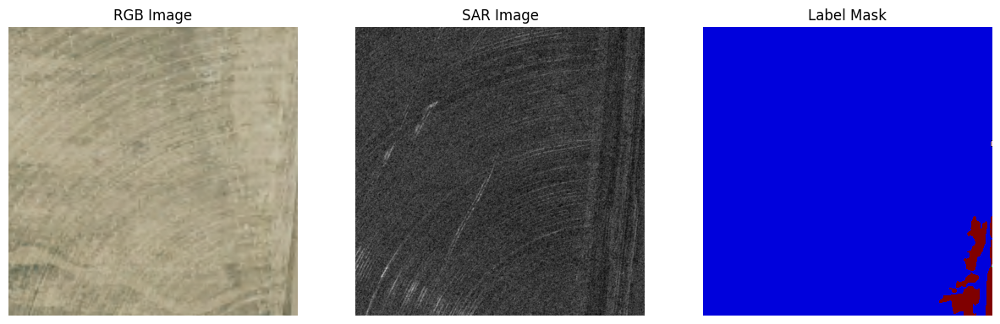

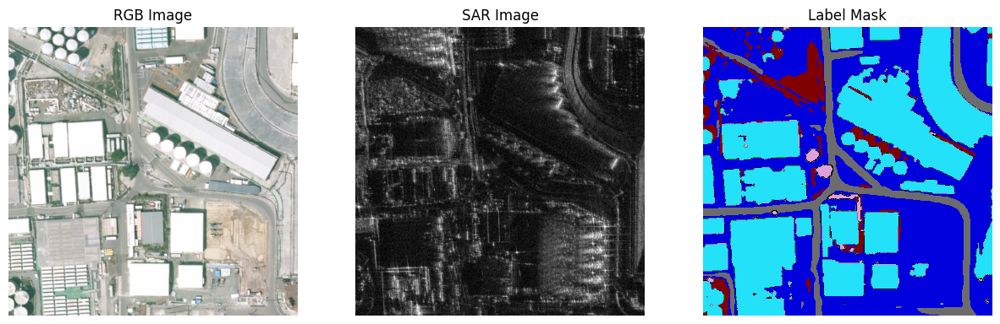

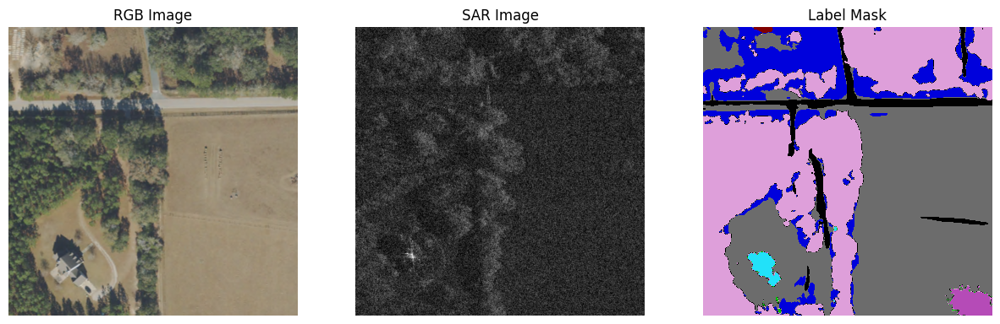

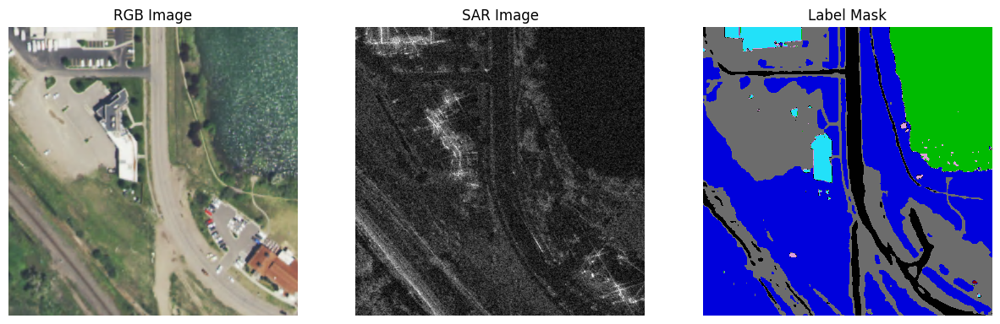

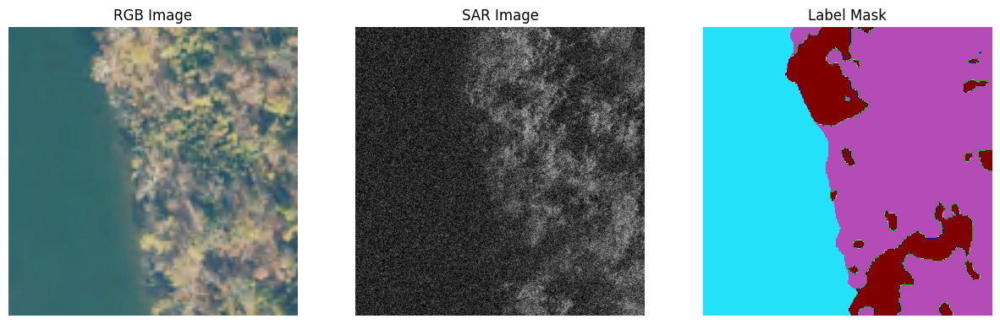

...

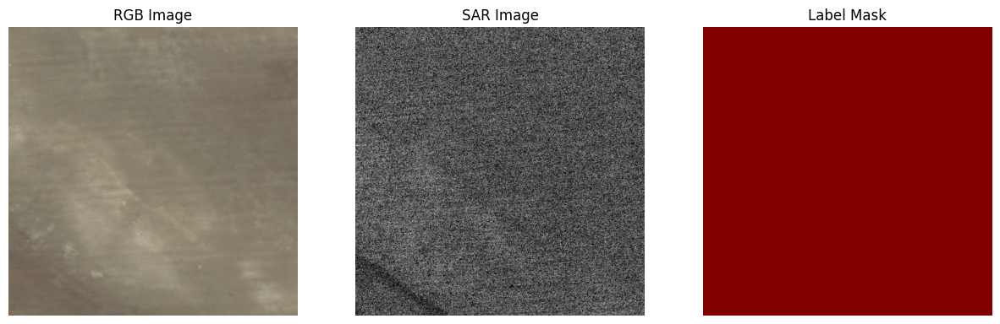

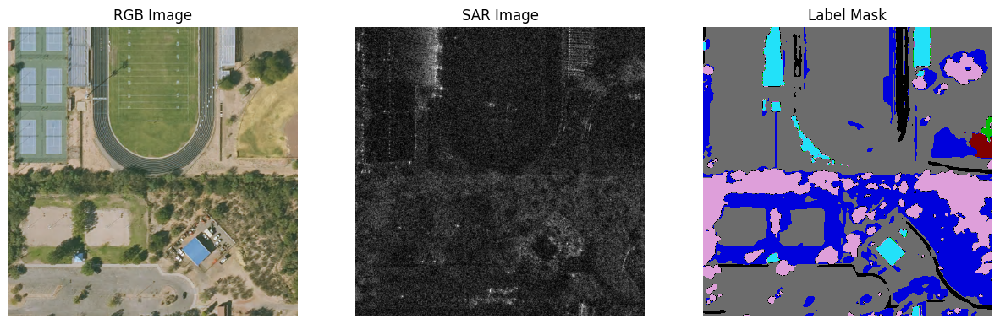

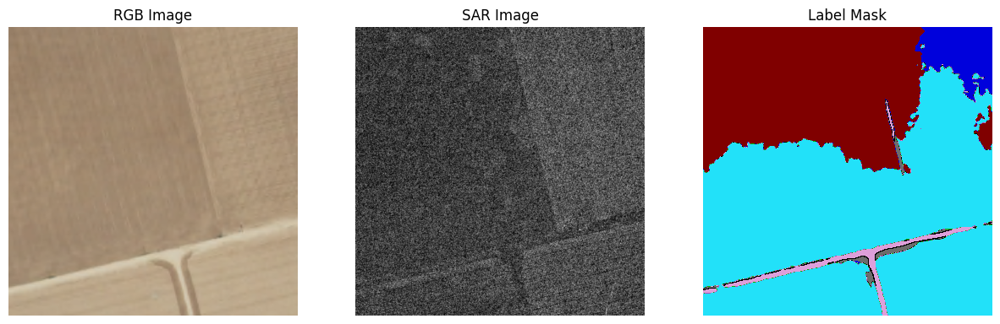

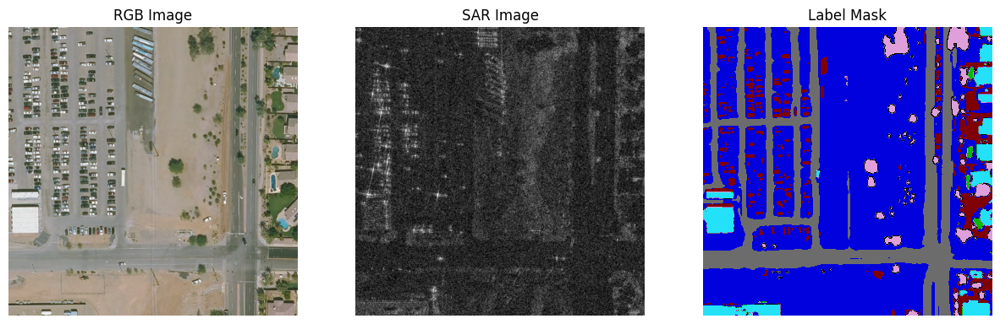

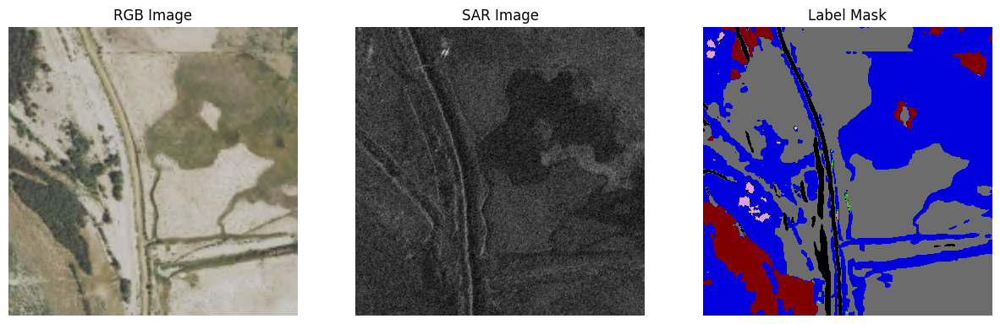

In [22]:
# Define custom colormap for label visualization
# class palette
# class_rgb = {
# "Bareland": [128/255, 0/255, 0/255],
#     "Grass": [0/255, 255/255, 36/255],
#     "Pavement": [148/255, 148/255, 148/255],
#     "Road": [255/255, 255/255, 255/255],
#     "Tree": [34/255, 97/255, 38/255],
#     "Water": [0/255, 69/255, 255/255],
#     "Cropland": [75/255, 181/255, 73/255],
#     "buildings": [222/255, 31/255, 7/255]}
class_rgb = {
    "Bareland": [128, 0, 0],
    "Grass": [0, 255, 36],
    "Pavement": [148, 148, 148],
    "Road": [255, 255, 255],
    "Tree": [34, 97, 38],
    "Water": [0, 69, 255],
    "Cropland": [75, 181, 73],
    "buildings": [222, 31, 7],
}


# class labels
class_gray = {
    "Bareland": 1,
    "Grass": 2,
    "Pavement": 3,
    "Road": 4,
    "Tree": 5,
    "Water": 6,
    "Cropland": 7,
    "buildings": 8,
}
custom_cmap = ListedColormap(list(class_rgb.values()))
def load_image(image_path):
    with rasterio.open(image_path) as src:
        return src.read().transpose(1, 2, 0)  # Convert to (H, W, C) format

def visualize_sample(index):
    """Visualizes RGB, SAR, and label images side by side."""
    rgb_image = load_image(os.path.join(TRAIN_RGB_DIR, image_filenames[index]))
    sar_image = load_image(os.path.join(TRAIN_SAR_DIR, sar_filenames[index]))
    label_image = load_image(os.path.join(TRAIN_LABEL_DIR, label_filenames[index]))
    
    # Plot images
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(rgb_image)
    axes[0].set_title("RGB Image")
    axes[0].axis("off")
    
    axes[1].imshow(sar_image[:, :, 0], cmap='gray')  # Assuming SAR is single-band grayscale
    axes[1].set_title("SAR Image")
    axes[1].axis("off")
    
    axes[2].imshow(label_image[:, :, 0], cmap=custom_cmap)  # Labels overlaid with colormap
    axes[2].set_title("Label Mask")
    axes[2].axis("off")
    
    plt.show()


for i in range(20):
    visualize_sample(i)

